# Breast Cancer Wisconsin 
-----

In [87]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [88]:
# import packages
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from pathlib import Path
import sys

In [89]:
CURRENT_DIR = Path('.').resolve()
MODULES_DIR = CURRENT_DIR.parent.joinpath('src')
sys.path.append(str(MODULES_DIR))
DATA_DIR = CURRENT_DIR.parent.joinpath('Data','Raw')

-----

# Carga de datos

In [90]:
df = pd.read_csv(str(DATA_DIR.joinpath('data_reto.csv')))

In [91]:
df.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [92]:
df.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


Elimanamos columnas que no son de utilidad, como el ID y la ultima columna que solo contenia valores nulos

In [93]:
df.drop('id', axis=1, inplace=True)

In [94]:
df.drop('Unnamed: 32', axis=1, inplace=True)

In [95]:
df.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


# Undersampling

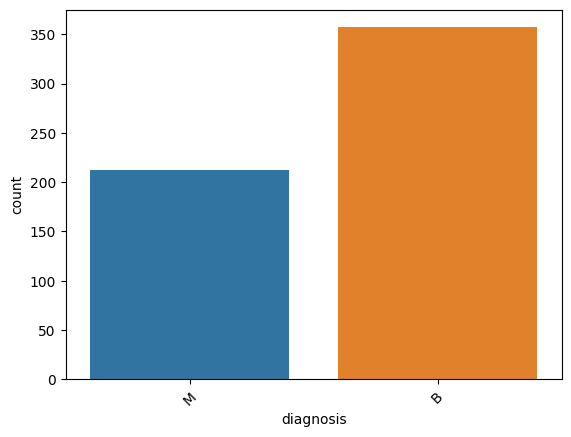

In [96]:
sns.countplot(data=df,
              x='diagnosis')
plt.xticks(rotation = 45)
plt.show()

In [97]:
from imblearn.under_sampling import RandomUnderSampler
undersample = RandomUnderSampler(random_state=42)

In [98]:
X = df.drop('diagnosis',axis=1)
y = df.diagnosis

In [99]:
X_over , y_over = undersample.fit_resample(X,y)

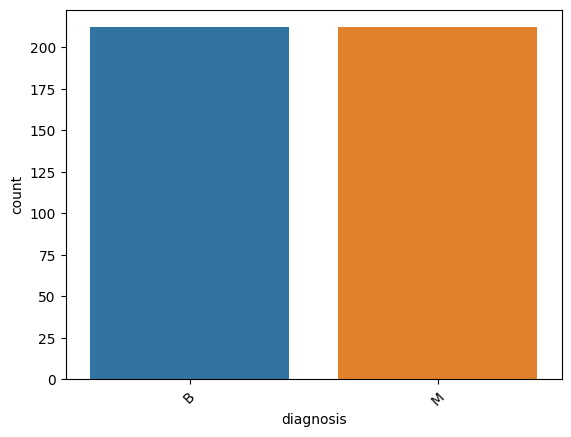

In [100]:
sns.countplot(data=pd.DataFrame(y_over),
              x='diagnosis')
plt.xticks(rotation = 45)
plt.show()

In [101]:
a=list(np.unique(y_over))

In [102]:
y_over.replace(a,[0,1],inplace=True)

El **1** es maligno

# Analisis exploratorio de datos

## Correlaciones

In [103]:
df_dea = X_over.copy()
df_dea['diagnosis'] = y_over

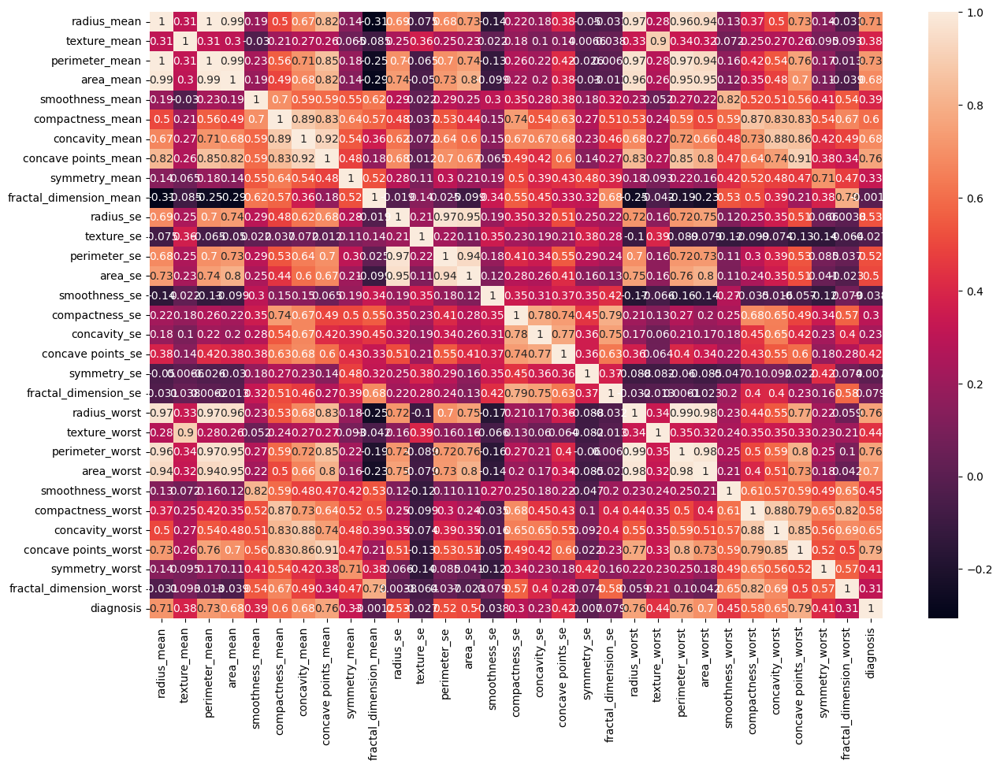

In [104]:
plt.figure(figsize=(15,10))
sns.heatmap(df_dea.corr(), annot=True)
plt.show()

In [105]:
X_over.drop(labels=['perimeter_mean','area_mean'],axis=1,inplace=True)
df_dea.drop(labels=['perimeter_mean','area_mean'],axis=1,inplace=True)

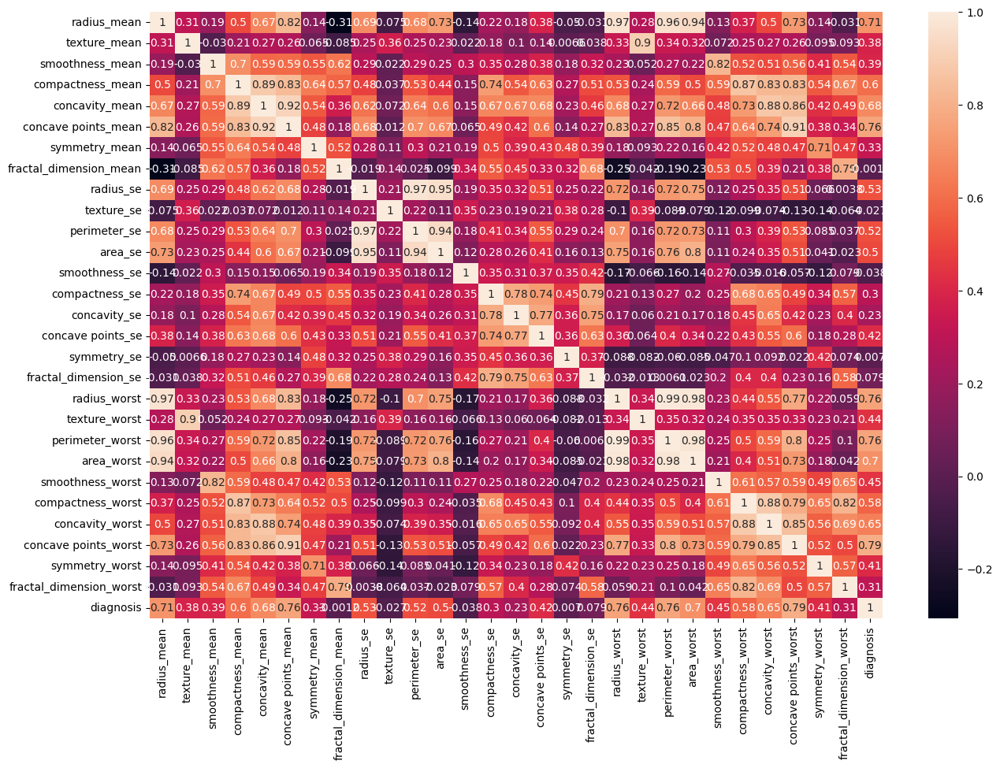

In [106]:
plt.figure(figsize=(15,10))
sns.heatmap(df_dea.corr(), annot=True)
plt.show()

In [107]:
X_over.drop(labels=['fractal_dimension_mean','fractal_dimension_se','symmetry_se','texture_se','smoothness_se'],axis=1,inplace=True)
df_dea.drop(labels=['fractal_dimension_mean','fractal_dimension_se','symmetry_se','texture_se','smoothness_se'],axis=1,inplace=True)

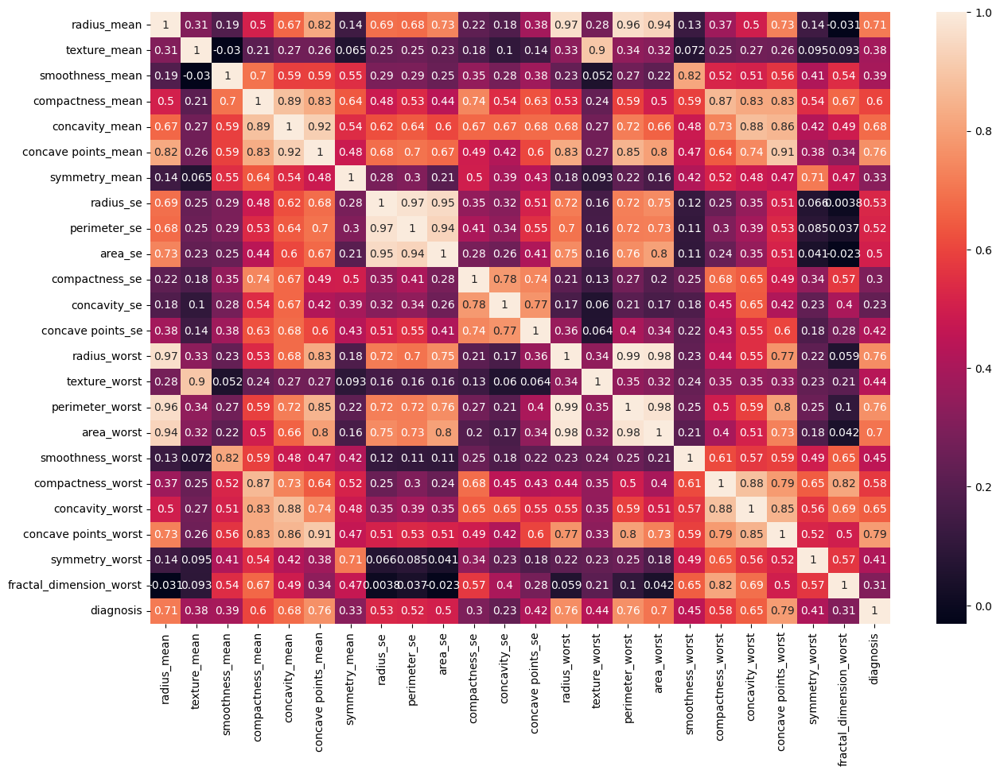

In [108]:
plt.figure(figsize=(15,10))
sns.heatmap(df_dea.corr(), annot=True)
plt.show()

In [109]:
X_over.drop(labels=['concavity_se'],axis=1,inplace=True)
df_dea.drop(labels=['concavity_se'],axis=1,inplace=True)

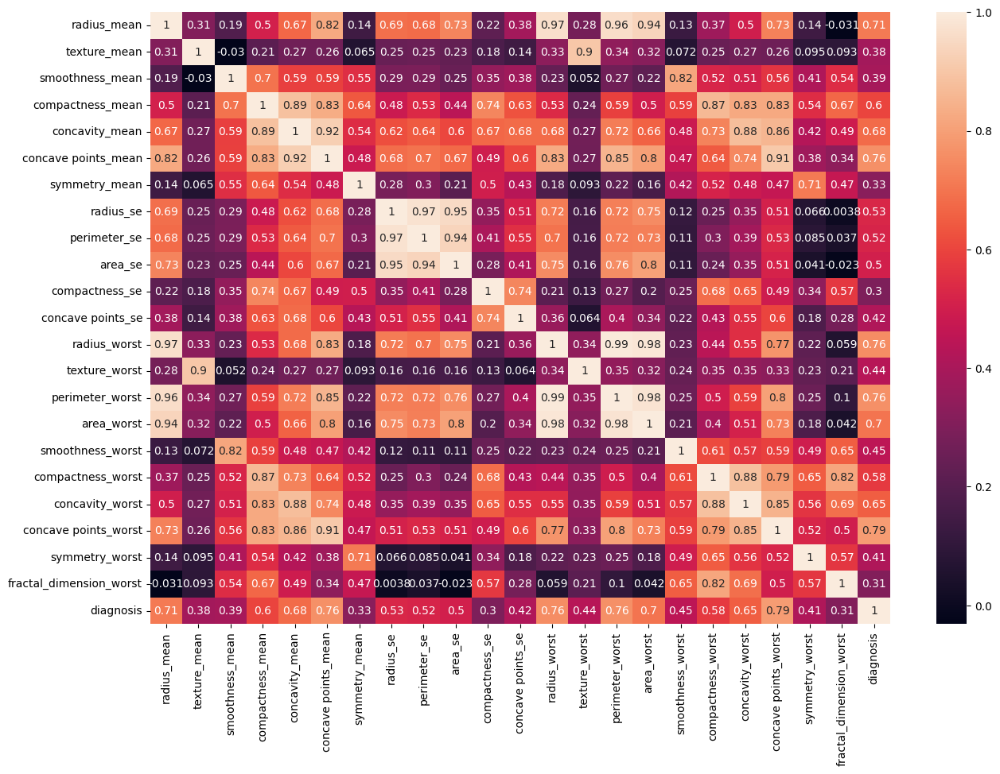

In [110]:
plt.figure(figsize=(15,10))
sns.heatmap(df_dea.corr(), annot=True)
plt.show()

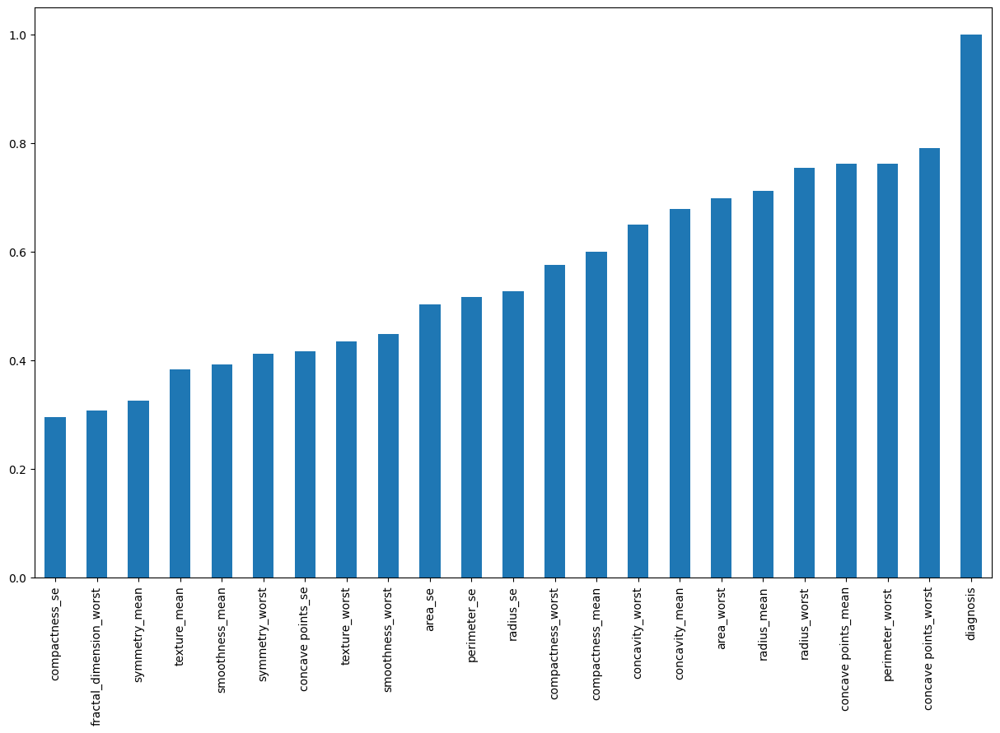

In [111]:
fig = plt.figure(figsize=(15,9))
df_dea.corr()['diagnosis'].sort_values(ascending=True).plot(kind='bar')
plt.show()

<Figure size 1000x1000 with 0 Axes>

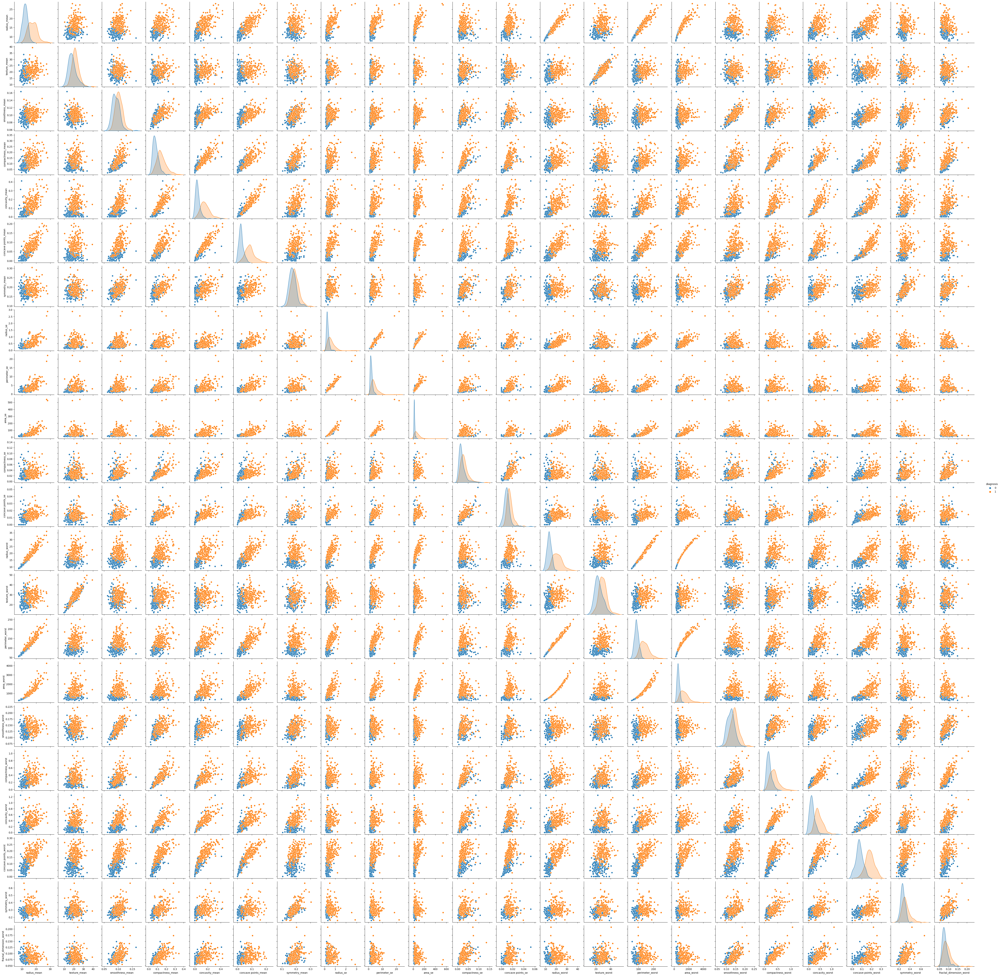

In [112]:
fig = plt.figure(figsize=(10,10))
sns.pairplot(data= df_dea, hue='diagnosis')
plt.show()

In [113]:
X_over.drop(labels=['symmetry_mean','compactness_se','fractal_dimension_worst','symmetry_worst'],axis=1,inplace=True)
df_dea.drop(labels=['symmetry_mean','compactness_se','fractal_dimension_worst','symmetry_worst'],axis=1,inplace=True)

# Split y escalamiento de datos

In [114]:
X_train, X_test, y_train , y_test = train_test_split(X_over, y_over, random_state=42, shuffle=True, test_size= .2)

In [115]:
st_x = StandardScaler()
X_train = st_x.fit_transform(X_train) 
X_test = st_x.transform(X_test)

In [116]:
X_test_scaled = pd.DataFrame(X_test, columns=X_over.columns)
X_train_scaled = pd.DataFrame(X_train, columns=X_over.columns)

In [117]:
X_test_scaled

,radius_mean,texture_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,radius_se,perimeter_se,area_se,concave points_se,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst
0,-0.701876,-0.919990,-1.167342,-0.697173,-0.761375,-0.981532,-0.677394,-0.655727,-0.550453,-0.926838,-0.789951,-1.131126,-0.798913,-0.741193,-1.047860,-0.668956,-0.760279,-1.172926
1,-0.001104,-0.744191,1.322647,0.915262,0.783948,0.807148,-0.079062,-0.093528,-0.120703,0.040486,0.295854,0.123798,0.355060,0.164792,2.244395,0.932706,0.743137,1.094810
2,-1.195416,-0.146018,0.175423,-0.465877,-0.861864,-1.093001,-0.306454,-0.390172,-0.460029,-0.590733,-1.149898,-0.531086,-1.153521,-0.978967,-0.530025,-0.761773,-1.046345,-1.409457
3,1.517689,0.422475,-0.414718,0.011028,-0.056535,0.527121,0.402081,0.437150,0.466960,0.333288,1.389615,-0.037504,1.327877,1.296653,-0.075340,-0.258070,-0.174217,0.710373
4,1.823083,0.561745,0.956886,0.059905,1.670473,2.029375,2.300927,1.929007,2.088580,1.863562,1.616322,-0.032665,1.467666,1.704785,0.274094,-0.406917,0.469581,1.372132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,-0.178342,1.808320,-1.066758,-0.149570,0.089168,-0.303856,-0.368700,-0.475236,-0.331630,-0.360190,-0.312674,2.248136,-0.346738,-0.382137,-1.111011,-0.229772,-0.008342,-0.673452
81,1.525869,0.169051,-0.410498,0.328732,0.586285,1.109075,1.213513,0.847357,0.992586,0.700061,1.174840,0.088311,1.065416,1.073586,-1.043650,-0.168649,0.004489,0.487341
82,-1.315392,-0.547844,0.232398,-0.684430,-0.919151,-0.951757,-0.602126,-0.616434,-0.578088,-0.678727,-1.225467,0.038308,-1.217424,-1.010031,0.240413,-0.809314,-0.928903,-0.925830
83,-0.382848,-1.340082,0.682565,0.052923,-0.531518,-0.092729,-0.929557,-0.908328,-0.653473,-0.563456,-0.495630,-1.335979,-0.562413,-0.553651,0.202523,-0.188457,-0.565536,0.079428


# Entrenar al modelo de regresion

In [118]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
result = model.fit(X_train_scaled, y_train)

# Evaluar el modelo

In [119]:
from sklearn import metrics
prediction_test = model.predict(X_test_scaled)
print(f'Accuracy: {metrics.accuracy_score(y_test,prediction_test)*100: .3f}')

Accuracy:  98.824


In [121]:
model.coef_

array([[ 0.38604379,  0.40654932,  0.09833229, -0.6845917 ,  0.55870755,
         1.2698243 ,  1.04765534,  0.61409376,  0.7592302 , -0.60449744,
         1.14186962,  1.12065175,  0.90646059,  1.04447729,  0.74632524,
        -0.15330102,  0.66483873,  1.2351903 ]])

In [122]:
model.feature_names_in_

array(['radius_mean', 'texture_mean', 'smoothness_mean',
       'compactness_mean', 'concavity_mean', 'concave points_mean',
       'radius_se', 'perimeter_se', 'area_se', 'concave points_se',
       'radius_worst', 'texture_worst', 'perimeter_worst', 'area_worst',
       'smoothness_worst', 'compactness_worst', 'concavity_worst',
       'concave points_worst'], dtype=object)

Axes(0.125,0.11;0.775x0.77)


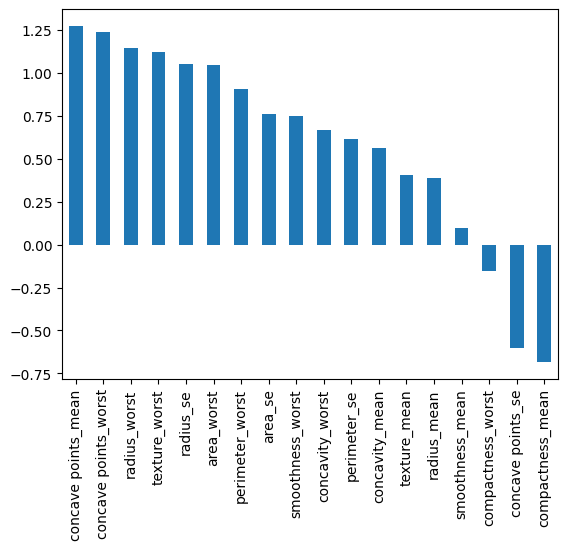

In [123]:
weights = pd.Series(model.coef_[0],
                    index=X_test_scaled.columns.values) 
print(weights.sort_values(ascending=False)[::].plot(kind='bar'))

# Eliminamos las caracteristicas menos relevantes para el modelo 

En este caso, eliminaremos 'smoothness_mean' y 'compactness_worst'


In [128]:
X_test_scaled.drop(labels=['smoothness_mean','compactness_worst','texture_mean','radius_mean','concavity_mean','concavity_worst','perimeter_se','smoothness_worst','area_se','concave points_se'],axis=1,inplace=True)
X_train_scaled.drop(labels=['smoothness_mean','compactness_worst','texture_mean','radius_mean','concavity_mean','concavity_worst','perimeter_se','smoothness_worst','area_se','concave points_se'],axis=1,inplace=True)

In [129]:
model2 = LogisticRegression()
result = model2.fit(X_train_scaled, y_train)

In [130]:
from sklearn import metrics
prediction_test = model2.predict(X_test_scaled)
print(f'Accuracy: {metrics.accuracy_score(y_test,prediction_test)*100: .3f}')

Accuracy:  98.824


Axes(0.125,0.11;0.775x0.77)


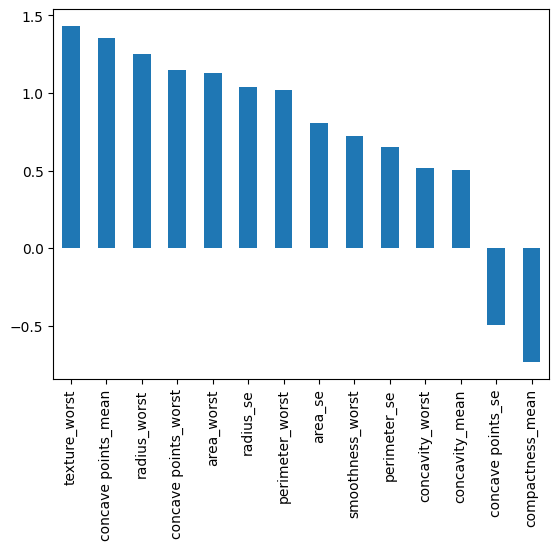

In [131]:
weights = pd.Series(model2.coef_[0],
                    index=X_test_scaled.columns.values) 
print(weights.sort_values(ascending=False)[::].plot(kind='bar'))
plt.show()

------

In [141]:
X_test_scaled.drop(labels=['compactness_mean'],axis=1,inplace=True)
X_train_scaled.drop(labels=['compactness_mean'],axis=1,inplace=True)

In [142]:
model3 = LogisticRegression()
result = model3.fit(X_train_scaled, y_train)

In [143]:
prediction_test = model3.predict(X_test_scaled)
print(f'Accuracy: {metrics.accuracy_score(y_test,prediction_test)*100: .3f}')

Accuracy:  97.647


Axes(0.125,0.11;0.775x0.77)


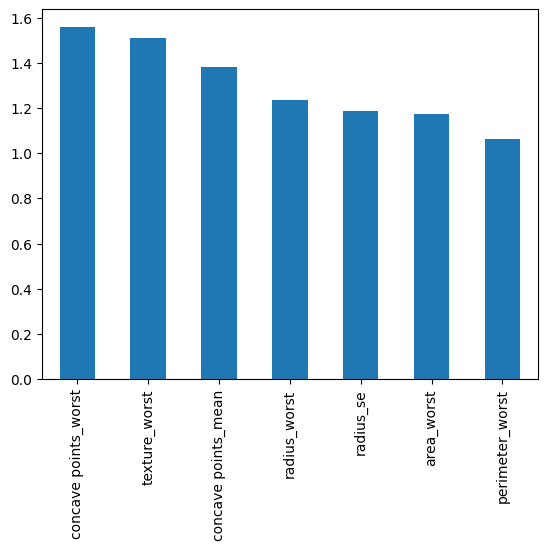

In [144]:
weights = pd.Series(model3.coef_[0],
                    index=X_test_scaled.columns.values) 
print(weights.sort_values(ascending=False)[::].plot(kind='bar'))
plt.show()

# Conclusiones

De una base de datos con 30 entradas, podemos reducir el problema a unicamente 7 varibles de interes con lo cual obtenemos una precisión del 97% sobre el test de prueba. Si bien. inicialemente, con 18 variables *importates* que teniamos en nuestro primer modelo la precisión es mayor, 98%, vale la pena perder ese 1% de precisión ya que bajamos en mucho el costo computacional 

In [145]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

<Figure size 1100x1100 with 0 Axes>

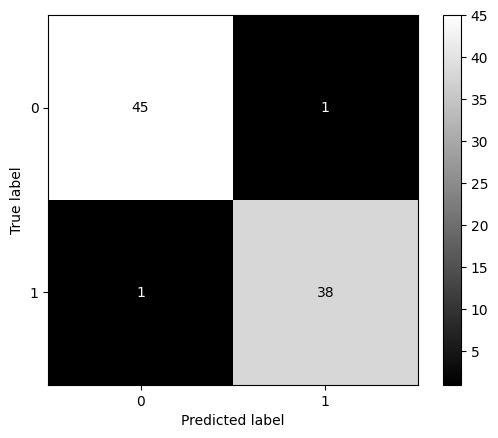

In [146]:
fig = plt.figure(figsize=(11,11))
cm = confusion_matrix(y_test, prediction_test, labels=model.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels=model.classes_)
disp.plot(cmap='gray')
plt.show()